In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import sklearn.metrics as metrics
import warnings
warnings.filterwarnings("ignore")
sns.set_style("darkgrid") # darkgrid, whitegrid, dark, white, and ticks
sns.despine() 
sns.set_context() # paper, notebook, talk, and poster 
sns.set_context("poster", font_scale = .5, rc={"grid.linewidth": 0.6})
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from skimpy import clean_columns
from imblearn.over_sampling import SMOTE 
import statsmodels.formula.api as SM

C:\Users\shail\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


<Figure size 432x288 with 0 Axes>

In [2]:
pd.options.display.float_format ='{:.2f}'.format

# Problem Statement

### Businesses or companies can fall prey to default if they are not able to keep up their debt obligations. Defaults will lead to a lower credit rating for the company which in turn reduces its chances of getting credit in the future and may have to pay higher interests on existing debts as well as any new obligations. From an investor's point of view, he would want to invest in a company if it is capable of handling its financial obligations, can grow quickly, and is able to manage the growth scale.

### A balance sheet is a financial statement of a company that provides a snapshot of what a company owns, owes, and the amount invested by the shareholders. Thus, it is an important tool that helps evaluate the performance of a business.

### Data that is available includes information from the financial statement of the companies for the previous year (2015). Also, information about the Networth of the company in the following year (2016) is provided which can be used to drive the labeled field.

In [3]:
df=pd.read_excel('Company_Data2015-1 (2).xlsx')
display(df.shape)
df.head()

(3586, 67)

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,0.00,0.00,0.00,0.00,0.00,0,0,45.00,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.00,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.00,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.00,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.00,0.01,0.05


In [4]:
df.columns.to_list()

['Co_Code',
 'Co_Name',
 'Networth Next Year',
 'Equity Paid Up',
 'Networth',
 'Capital Employed',
 'Total Debt',
 'Gross Block ',
 'Net Working Capital ',
 'Current Assets ',
 'Current Liabilities and Provisions ',
 'Total Assets/Liabilities ',
 'Gross Sales',
 'Net Sales',
 'Other Income',
 'Value Of Output',
 'Cost of Production',
 'Selling Cost',
 'PBIDT',
 'PBDT',
 'PBIT',
 'PBT',
 'PAT',
 'Adjusted PAT',
 'CP',
 'Revenue earnings in forex',
 'Revenue expenses in forex',
 'Capital expenses in forex',
 'Book Value (Unit Curr)',
 'Book Value (Adj.) (Unit Curr)',
 'Market Capitalisation',
 'CEPS (annualised) (Unit Curr)',
 'Cash Flow From Operating Activities',
 'Cash Flow From Investing Activities',
 'Cash Flow From Financing Activities',
 'ROG-Net Worth (%)',
 'ROG-Capital Employed (%)',
 'ROG-Gross Block (%)',
 'ROG-Gross Sales (%)',
 'ROG-Net Sales (%)',
 'ROG-Cost of Production (%)',
 'ROG-Total Assets (%)',
 'ROG-PBIDT (%)',
 'ROG-PBDT (%)',
 'ROG-PBIT (%)',
 'ROG-PBT (%)',
 '

In [5]:
df.columns=df.columns.str.replace('%','perc').str.replace('/','_by_')

In [6]:
df = clean_columns(df,
                   case='const')

61 column names have been cleaned

In [7]:
df.columns.to_list()

['CO_CODE',
 'CO_NAME',
 'NETWORTH_NEXT_YEAR',
 'EQUITY_PAID_UP',
 'NETWORTH',
 'CAPITAL_EMPLOYED',
 'TOTAL_DEBT',
 'GROSS_BLOCK',
 'NET_WORKING_CAPITAL',
 'CURRENT_ASSETS',
 'CURRENT_LIABILITIES_AND_PROVISIONS',
 'TOTAL_ASSETS_BY_LIABILITIES',
 'GROSS_SALES',
 'NET_SALES',
 'OTHER_INCOME',
 'VALUE_OF_OUTPUT',
 'COST_OF_PRODUCTION',
 'SELLING_COST',
 'PBIDT',
 'PBDT',
 'PBIT',
 'PBT',
 'PAT',
 'ADJUSTED_PAT',
 'CP',
 'REVENUE_EARNINGS_IN_FOREX',
 'REVENUE_EXPENSES_IN_FOREX',
 'CAPITAL_EXPENSES_IN_FOREX',
 'BOOK_VALUE_UNIT_CURR',
 'BOOK_VALUE_ADJ_UNIT_CURR',
 'MARKET_CAPITALISATION',
 'CEPS_ANNUALISED_UNIT_CURR',
 'CASH_FLOW_FROM_OPERATING_ACTIVITIES',
 'CASH_FLOW_FROM_INVESTING_ACTIVITIES',
 'CASH_FLOW_FROM_FINANCING_ACTIVITIES',
 'ROG_NET_WORTH_PERC',
 'ROG_CAPITAL_EMPLOYED_PERC',
 'ROG_GROSS_BLOCK_PERC',
 'ROG_GROSS_SALES_PERC',
 'ROG_NET_SALES_PERC',
 'ROG_COST_OF_PRODUCTION_PERC',
 'ROG_TOTAL_ASSETS_PERC',
 'ROG_PBIDT_PERC',
 'ROG_PBDT_PERC',
 'ROG_PBIT_PERC',
 'ROG_PBT_PERC',
 'RO

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   CO_CODE                              3586 non-null   int64  
 1   CO_NAME                              3586 non-null   object 
 2   NETWORTH_NEXT_YEAR                   3586 non-null   float64
 3   EQUITY_PAID_UP                       3586 non-null   float64
 4   NETWORTH                             3586 non-null   float64
 5   CAPITAL_EMPLOYED                     3586 non-null   float64
 6   TOTAL_DEBT                           3586 non-null   float64
 7   GROSS_BLOCK                          3586 non-null   float64
 8   NET_WORKING_CAPITAL                  3586 non-null   float64
 9   CURRENT_ASSETS                       3586 non-null   float64
 10  CURRENT_LIABILITIES_AND_PROVISIONS   3586 non-null   float64
 11  TOTAL_ASSETS_BY_LIABILITIES   

In [9]:
df.isnull().sum().sort_values(ascending=False)

INVENTORY_VELOCITY_DAYS           103
BOOK_VALUE_ADJ_UNIT_CURR            4
INTEREST_COVER_RATIO_LATEST         1
PBITM_PERC_LATEST                   1
FIXED_ASSETS_RATIO_LATEST           1
                                 ... 
CAPITAL_EXPENSES_IN_FOREX           0
BOOK_VALUE_UNIT_CURR                0
MARKET_CAPITALISATION               0
CEPS_ANNUALISED_UNIT_CURR           0
VALUE_OF_OUTPUT_BY_GROSS_BLOCK      0
Length: 67, dtype: int64

In [10]:
df.isnull().sum().sum()

118

In [11]:
df.duplicated().sum()

0

In [12]:
pd.options.display.max_rows=70
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CO_CODE,3586.00,16065.39,19776.82,4.00,3029.25,6077.50,24269.50,72493.00
NETWORTH_NEXT_YEAR,3586.00,725.05,4769.68,-8021.60,3.98,19.02,123.80,111729.10
EQUITY_PAID_UP,3586.00,62.97,778.76,0.00,3.75,8.29,19.52,42263.46
NETWORTH,3586.00,649.75,4091.99,-7027.48,3.89,18.58,117.30,81657.35
CAPITAL_EMPLOYED,3586.00,2799.61,26975.14,-1824.75,7.60,39.09,226.60,714001.25
TOTAL_DEBT,3586.00,1994.82,23652.84,-0.72,0.03,7.49,72.35,652823.81
GROSS_BLOCK,3586.00,594.18,4871.55,-41.19,0.57,15.87,131.90,128477.59
NET_WORKING_CAPITAL,3586.00,410.81,6301.22,-13162.42,0.94,10.14,61.17,223257.56
CURRENT_ASSETS,3586.00,1960.35,22577.57,-0.91,4.00,24.54,135.28,721166.00
CURRENT_LIABILITIES_AND_PROVISIONS,3586.00,391.99,2675.00,-0.23,0.73,9.23,65.65,83232.98


# 1.1 Outlier Treatment
6

Proportion of Default in the dataset


0    3043
1     543
Name: default, dtype: int64

0   84.86
1   15.14
Name: default, dtype: float64

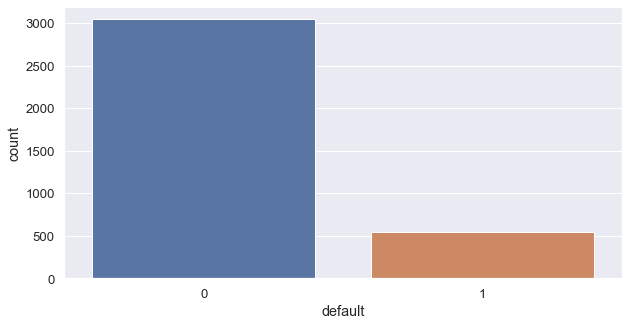

In [13]:
df.drop(['CO_CODE','CO_NAME'],axis=1,inplace=True)  # drop the categorical columns 
df['default'] = np.where(df.NET_WORKING_CAPITAL>0,0,1) # replace NETWORTH_NEXT_YEAR by binary column 0 and 1
y=df['default']  # seperate the target variable
print('Proportion of Default in the dataset')
display(df.default.value_counts())
print('\n')
display(np.around(df.default.value_counts(normalize=True)*100,2))
print('\n')
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.countplot(df.default);

In [14]:
X= df.drop(['NETWORTH_NEXT_YEAR','default'],axis=1)  # drop NETWORTH_NEXT_YEAR and default
y= df[['default']]
display(X.shape)
display(X.head())
display(y.shape)
display(y.head())

(3586, 64)

,EQUITY_PAID_UP,NETWORTH,CAPITAL_EMPLOYED,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_ASSETS,CURRENT_LIABILITIES_AND_PROVISIONS,TOTAL_ASSETS_BY_LIABILITIES,GROSS_SALES,...,PBIDTM_PERC_LATEST,PBITM_PERC_LATEST,PBDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_TOTAL_ASSETS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK
0,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,0.00,...,0.00,0.00,0.00,0.00,0.00,0,0,45.00,0.00,0.00
1,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,2892.73,...,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.00,0.31,0.24
2,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,392.13,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.00,-0.03,-0.26
3,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1354.39,...,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.00,0.24,1.90
4,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,38.72,...,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.00,0.01,0.05


(3586, 1)

,default
0,1
1,1
2,0
3,1
4,0


In [15]:
features=X.columns.to_list()
features

['EQUITY_PAID_UP',
 'NETWORTH',
 'CAPITAL_EMPLOYED',
 'TOTAL_DEBT',
 'GROSS_BLOCK',
 'NET_WORKING_CAPITAL',
 'CURRENT_ASSETS',
 'CURRENT_LIABILITIES_AND_PROVISIONS',
 'TOTAL_ASSETS_BY_LIABILITIES',
 'GROSS_SALES',
 'NET_SALES',
 'OTHER_INCOME',
 'VALUE_OF_OUTPUT',
 'COST_OF_PRODUCTION',
 'SELLING_COST',
 'PBIDT',
 'PBDT',
 'PBIT',
 'PBT',
 'PAT',
 'ADJUSTED_PAT',
 'CP',
 'REVENUE_EARNINGS_IN_FOREX',
 'REVENUE_EXPENSES_IN_FOREX',
 'CAPITAL_EXPENSES_IN_FOREX',
 'BOOK_VALUE_UNIT_CURR',
 'BOOK_VALUE_ADJ_UNIT_CURR',
 'MARKET_CAPITALISATION',
 'CEPS_ANNUALISED_UNIT_CURR',
 'CASH_FLOW_FROM_OPERATING_ACTIVITIES',
 'CASH_FLOW_FROM_INVESTING_ACTIVITIES',
 'CASH_FLOW_FROM_FINANCING_ACTIVITIES',
 'ROG_NET_WORTH_PERC',
 'ROG_CAPITAL_EMPLOYED_PERC',
 'ROG_GROSS_BLOCK_PERC',
 'ROG_GROSS_SALES_PERC',
 'ROG_NET_SALES_PERC',
 'ROG_COST_OF_PRODUCTION_PERC',
 'ROG_TOTAL_ASSETS_PERC',
 'ROG_PBIDT_PERC',
 'ROG_PBDT_PERC',
 'ROG_PBIT_PERC',
 'ROG_PBT_PERC',
 'ROG_PAT_PERC',
 'ROG_CP_PERC',
 'ROG_REVENUE_EARN

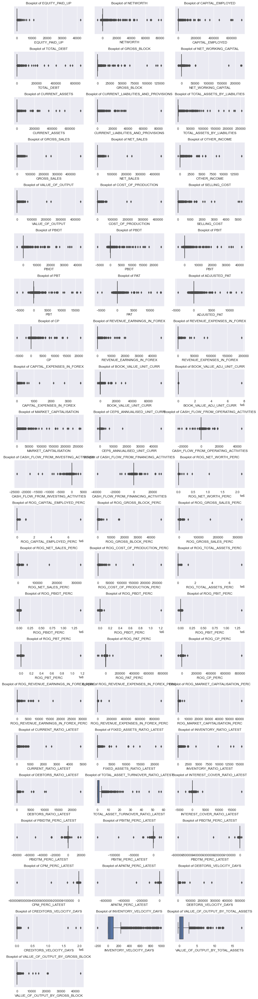

In [16]:
# Visualize the outliers
plt.figure(figsize = (12,50))

sns.set(font_scale=1)
for i in range(len(features)):
    plt.subplot(23, 3, i + 1)
    sns.boxplot(x = X[features[i]])
    plt.title('Boxplot of {}'.format(features[i]))
    plt.tight_layout()

In [17]:
df.columns.to_list()

['NETWORTH_NEXT_YEAR',
 'EQUITY_PAID_UP',
 'NETWORTH',
 'CAPITAL_EMPLOYED',
 'TOTAL_DEBT',
 'GROSS_BLOCK',
 'NET_WORKING_CAPITAL',
 'CURRENT_ASSETS',
 'CURRENT_LIABILITIES_AND_PROVISIONS',
 'TOTAL_ASSETS_BY_LIABILITIES',
 'GROSS_SALES',
 'NET_SALES',
 'OTHER_INCOME',
 'VALUE_OF_OUTPUT',
 'COST_OF_PRODUCTION',
 'SELLING_COST',
 'PBIDT',
 'PBDT',
 'PBIT',
 'PBT',
 'PAT',
 'ADJUSTED_PAT',
 'CP',
 'REVENUE_EARNINGS_IN_FOREX',
 'REVENUE_EXPENSES_IN_FOREX',
 'CAPITAL_EXPENSES_IN_FOREX',
 'BOOK_VALUE_UNIT_CURR',
 'BOOK_VALUE_ADJ_UNIT_CURR',
 'MARKET_CAPITALISATION',
 'CEPS_ANNUALISED_UNIT_CURR',
 'CASH_FLOW_FROM_OPERATING_ACTIVITIES',
 'CASH_FLOW_FROM_INVESTING_ACTIVITIES',
 'CASH_FLOW_FROM_FINANCING_ACTIVITIES',
 'ROG_NET_WORTH_PERC',
 'ROG_CAPITAL_EMPLOYED_PERC',
 'ROG_GROSS_BLOCK_PERC',
 'ROG_GROSS_SALES_PERC',
 'ROG_NET_SALES_PERC',
 'ROG_COST_OF_PRODUCTION_PERC',
 'ROG_TOTAL_ASSETS_PERC',
 'ROG_PBIDT_PERC',
 'ROG_PBDT_PERC',
 'ROG_PBIT_PERC',
 'ROG_PBT_PERC',
 'ROG_PAT_PERC',
 'ROG_CP_PE

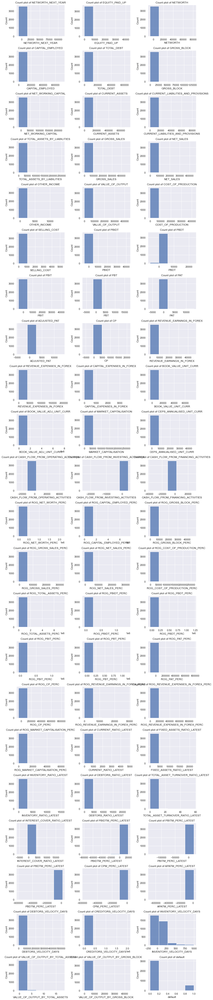

In [18]:
plt.figure(figsize = (12,60)) 
sns.set(font_scale=1)
for i in range(len(df.columns)):
    plt.subplot(22, 3, i + 1)
    sns.histplot(x = df[df.columns[i]],kde=False,bins=5)
    plt.title('Count plot of {}'.format(df.columns[i]))
    plt.tight_layout()


In [19]:
Q1 = X.quantile(0.25)
Q3 = X.quantile(0.75)
IQR = Q3 - Q1
UL = Q3 + 1.5*IQR
LL = Q1 - 1.5*IQR

In [20]:
((X > UL) | (X < LL)).sum().sort_values(ascending=False)

ROG_REVENUE_EXPENSES_IN_FOREX_PERC     1615
ROG_REVENUE_EARNINGS_IN_FOREX_PERC     1317
CASH_FLOW_FROM_FINANCING_ACTIVITIES    1005
PAT                                     959
ADJUSTED_PAT                            954
PBT                                     941
APATM_PERC_LATEST                       933
CASH_FLOW_FROM_INVESTING_ACTIVITIES     876
ROG_GROSS_BLOCK_PERC                    830
CP                                      816
PBDT                                    815
CASH_FLOW_FROM_OPERATING_ACTIVITIES     801
ROG_NET_WORTH_PERC                      747
REVENUE_EARNINGS_IN_FOREX               738
INTEREST_COVER_RATIO_LATEST             725
PBIT                                    720
CPM_PERC_LATEST                         720
PBITM_PERC_LATEST                       717
PBDTM_PERC_LATEST                       695
CAPITAL_EXPENSES_IN_FOREX               694
REVENUE_EXPENSES_IN_FOREX               693
ROG_COST_OF_PRODUCTION_PERC             675
ROG_GROSS_SALES_PERC            

In [21]:
((X > UL) | (X < LL)).sum().sum()

41355

In [22]:
((X > UL) | (X < LL)).sum().sum()*100/X.size

18.019293781372003

In [23]:
# 18 % of the data are outliers
# We shall convert these into Nan and add to the 118 original missing values


In [24]:
X[((X > UL) | (X < LL))]=np.nan  # replace all outliers by Nan

# 1.2 Missing Value Treatment
3.5

In [25]:
X.isnull().sum().sum()*100/X.size

18.070709007250418

In [26]:
# 18 % data has to be treated for outliers and missing values

In [27]:
# we will remove those columns which have more than 30 % records missing
X.isnull().sum().sort_values(ascending=False)*100/X.shape[0]

ROG_REVENUE_EXPENSES_IN_FOREX_PERC    45.04
ROG_REVENUE_EARNINGS_IN_FOREX_PERC    36.73
CASH_FLOW_FROM_FINANCING_ACTIVITIES   28.03
PAT                                   26.74
ADJUSTED_PAT                          26.60
PBT                                   26.24
APATM_PERC_LATEST                     26.05
CASH_FLOW_FROM_INVESTING_ACTIVITIES   24.43
ROG_GROSS_BLOCK_PERC                  23.15
CP                                    22.76
PBDT                                  22.73
CASH_FLOW_FROM_OPERATING_ACTIVITIES   22.34
ROG_NET_WORTH_PERC                    20.83
REVENUE_EARNINGS_IN_FOREX             20.58
INTEREST_COVER_RATIO_LATEST           20.25
CPM_PERC_LATEST                       20.11
PBIT                                  20.08
PBITM_PERC_LATEST                     20.02
PBDTM_PERC_LATEST                     19.41
CAPITAL_EXPENSES_IN_FOREX             19.35
REVENUE_EXPENSES_IN_FOREX             19.33
ROG_COST_OF_PRODUCTION_PERC           18.82
ROG_GROSS_SALES_PERC            

In [28]:
# We shall drop ROG_REVENUE_EXPENSES_IN_FOREX_PERC and ROG_REVENUE_EARNINGS_IN_FOREX_PERC 
X.drop(['ROG_REVENUE_EXPENSES_IN_FOREX_PERC','ROG_REVENUE_EARNINGS_IN_FOREX_PERC'],axis=1,inplace=True)

In [29]:
X.shape  # check the shape of X after dropping these two features

(3586, 62)

In [30]:
# We shall also check for rows that have more than 10 % recodrs missing

In [31]:
X.isnull().sum(axis=1)*100/X.shape[1]

0      30.65
1      51.61
2      66.13
3      54.84
4      53.23
        ... 
3581   48.39
3582   54.84
3583   51.61
3584   45.16
3585   54.84
Length: 3586, dtype: float64

In [32]:
X_temp =X[X.isnull().sum(axis=1) <= round(X.columns.size*0.1)]
X_temp.shape

(1592, 62)

#### Out of a total of 3586 rows , there are 1592 rows which have more than 90% records available, rest of the rows that is 1994 rows or 55%  of the rows have incomplte data. This is too much and we can  not drop the rows. So we shall impute the missing values  

In [33]:
# We shall split the data into train and test before scaling and imputing the Nan values
seed =123
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=seed,stratify=y.default,test_size=0.33)

Proportion of Default in the dataset


0    3043
1     543
Name: default, dtype: int64

0   84.86
1   15.14
Name: default, dtype: float64

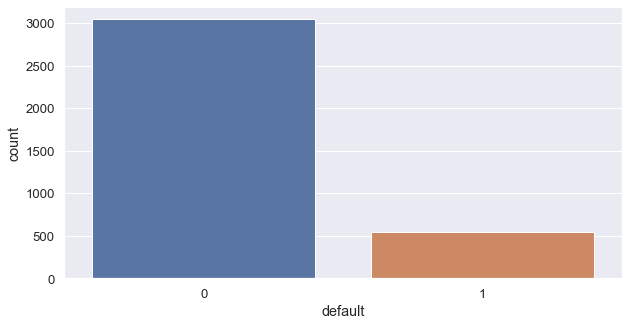

In [34]:
print('Proportion of Default in the dataset')
display(df.default.value_counts())
print('\n')
display(np.around(df.default.value_counts(normalize=True)*100,2))
print('\n')
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.countplot(df.default);

In [35]:
print('Proportion of Default in the Train data Set')
display(y_train.value_counts())
print('\n')
display(np.around(y_train.value_counts(normalize=True)*100,2))
print('\n')
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)

Proportion of Default in the Train data Set


default
0          2038
1           364
dtype: int64

default
0         84.85
1         15.15
dtype: float64

<Figure size 720x360 with 0 Axes>

In [36]:
print('Proportion of Default in the Test dataset')
display(y_test.value_counts())
print('\n')
display(np.around(y_test.value_counts(normalize=True)*100,2))
print('\n')
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)

Proportion of Default in the Test dataset


default
0          1005
1           179
dtype: int64

default
0         84.88
1         15.12
dtype: float64

<Figure size 720x360 with 0 Axes>

In [37]:
# We shall scale the data first
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train),
                              columns=X_train.columns)         # fit and transform the train data and make it a dataframe
X_test_scaled = pd.DataFrame(scaler.transform(X_test),
                             columns=X_test.columns)           # only transform the test data

In [38]:
imputer = KNNImputer(n_neighbors=5)
X_train_scaled_imputed=pd.DataFrame(imputer.fit_transform(X_train_scaled),
                                    columns=X_train_scaled.columns)
X_test_scaled_imputed=pd.DataFrame(imputer.transform(X_test_scaled),
                                   columns=X_test_scaled.columns)
display(X_train_scaled_imputed.shape)
display(X_train_scaled_imputed.head())
display(X_test_scaled_imputed.shape)
display(X_test_scaled_imputed.head())

(2402, 62)

,EQUITY_PAID_UP,NETWORTH,CAPITAL_EMPLOYED,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_ASSETS,CURRENT_LIABILITIES_AND_PROVISIONS,TOTAL_ASSETS_BY_LIABILITIES,GROSS_SALES,...,PBIDTM_PERC_LATEST,PBITM_PERC_LATEST,PBDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_TOTAL_ASSETS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK
0,0.61,-0.43,-0.44,-0.56,-0.44,-0.58,-0.52,-0.33,-0.45,-0.59,...,-0.75,-0.64,-0.63,-0.63,-0.48,-0.95,-0.94,-0.85,-0.97,-0.80
1,-0.56,-0.54,-0.61,-0.54,-0.59,-0.59,-0.66,-0.60,-0.63,-0.59,...,1.28,1.95,1.91,2.50,1.18,-0.95,-0.94,-0.85,-0.97,-0.80
2,0.04,-0.42,-0.51,-0.43,-0.59,-0.45,-0.59,-0.58,-0.55,-0.58,...,-0.36,-0.14,-0.14,-0.26,0.08,-0.54,-0.94,-0.85,-0.88,-0.17
3,-0.30,0.44,-0.05,-0.45,-0.11,-0.66,-0.45,-0.11,-0.12,-0.32,...,1.13,0.15,1.66,1.93,0.44,0.11,1.81,0.46,-0.35,-0.60
4,-0.45,-0.41,-0.47,-0.34,-0.22,-0.54,-0.48,-0.28,-0.46,-0.43,...,0.95,0.78,0.99,0.98,0.60,0.95,1.03,0.81,0.32,-0.41


(1184, 62)

,EQUITY_PAID_UP,NETWORTH,CAPITAL_EMPLOYED,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_ASSETS,CURRENT_LIABILITIES_AND_PROVISIONS,TOTAL_ASSETS_BY_LIABILITIES,GROSS_SALES,...,PBIDTM_PERC_LATEST,PBITM_PERC_LATEST,PBDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_TOTAL_ASSETS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK
0,-0.51,-0.44,-0.43,-0.17,-0.25,-0.37,-0.52,-0.54,-0.49,-0.25,...,-0.01,-0.23,-0.16,-0.03,-0.55,-0.57,-0.77,-0.03,1.32,-0.14
1,-1.03,-0.54,-0.55,-0.42,-0.40,-0.54,-0.62,-0.56,-0.58,-0.49,...,0.00,-0.17,-0.06,0.08,-0.30,-0.66,-0.69,0.20,1.26,-0.27
2,-0.72,-0.05,-0.34,-0.56,-0.58,-0.50,-0.58,-0.53,-0.42,-0.54,...,0.75,1.22,1.20,1.17,0.60,-0.95,-0.71,0.70,-0.79,2.44
3,-0.72,-0.54,-0.61,-0.56,-0.59,-0.49,-0.61,-0.60,-0.63,-0.27,...,-0.77,-0.66,-0.66,-0.68,-0.56,-0.95,-0.94,-0.83,-0.69,-0.59
4,1.01,-0.28,-0.47,-0.55,-0.58,-0.19,-0.46,-0.60,-0.53,-0.59,...,-0.81,-0.71,-0.71,-0.72,-0.62,1.48,-0.94,-0.85,-0.97,-0.80


In [39]:
# Now we check for null values after the treatment
X_train_scaled_imputed.isnull().sum().sum() 

0

In [40]:
X_test_scaled_imputed.isnull().sum().sum()

0

#### There are no null values in either the train data or the test data set.

# 1.3 Transform Target variable into 0 and 1
2

### we have already done this above Code # 13 

# 1.4 Univariate (4 marks) & Bivariate ( 6marks) analysis with proper interpretation. (You may choose to include only those variables which were significant in the model building)

## Univariate analysis

In [41]:
Xi_train = X_train_scaled_imputed
Xi_test = X_test_scaled_imputed

In [42]:
Xy = pd.concat([X,y],axis=1) 
Xy        # Xy is the full data before splitting ( Train and test ) and before scaling and imputing

,EQUITY_PAID_UP,NETWORTH,CAPITAL_EMPLOYED,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_ASSETS,CURRENT_LIABILITIES_AND_PROVISIONS,TOTAL_ASSETS_BY_LIABILITIES,GROSS_SALES,...,PBITM_PERC_LATEST,PBDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_TOTAL_ASSETS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK,default
0,NaN,NaN,NaN,NaN,NaN,NaN,40.50,NaN,109.60,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,45.00,0.00,0.00,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,29.00,101.00,2.00,0.31,0.24,1
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,392.13,...,NaN,NaN,NaN,NaN,97.00,NaN,0.00,-0.03,-0.26,0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-7.21,NaN,NaN,NaN,93.00,63.00,2.00,0.24,1.90,1
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.72,...,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.01,0.05,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3581,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN,NaN,NaN,...,0.00,0.00,0.00,0.00,0.00,0.00,NaN,0.60,7.76,1
3582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,32.17,29.81,NaN,NaN,13.00,53.00,77.00,0.29,1.00,0
3583,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.69,7.31,5.69,4.29,7.00,30.00,48.00,1.42,3.24,0
3584,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,20.55,23.39,19.55,11.99,32.00,69.00,42.00,0.36,0.68,0


In [43]:
Xi=pd.concat([Xi_train,Xi_test],axis=0)  # join the train and test data one over the other so that we again have 3586 rows
features=Xi.columns.to_list()

In [44]:
#### We shall now cocatenate Xi and y and see how they interact
display(y.shape)
display(y)
display(Xi.shape)
display(Xi)

(3586, 1)

,default
0,1
1,1
2,0
3,1
4,0
...,...
3581,1
3582,0
3583,0
3584,0


(3586, 62)

,EQUITY_PAID_UP,NETWORTH,CAPITAL_EMPLOYED,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_ASSETS,CURRENT_LIABILITIES_AND_PROVISIONS,TOTAL_ASSETS_BY_LIABILITIES,GROSS_SALES,...,PBIDTM_PERC_LATEST,PBITM_PERC_LATEST,PBDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_TOTAL_ASSETS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK
0,0.61,-0.43,-0.44,-0.56,-0.44,-0.58,-0.52,-0.33,-0.45,-0.59,...,-0.75,-0.64,-0.63,-0.63,-0.48,-0.95,-0.94,-0.85,-0.97,-0.80
1,-0.56,-0.54,-0.61,-0.54,-0.59,-0.59,-0.66,-0.60,-0.63,-0.59,...,1.28,1.95,1.91,2.50,1.18,-0.95,-0.94,-0.85,-0.97,-0.80
2,0.04,-0.42,-0.51,-0.43,-0.59,-0.45,-0.59,-0.58,-0.55,-0.58,...,-0.36,-0.14,-0.14,-0.26,0.08,-0.54,-0.94,-0.85,-0.88,-0.17
3,-0.30,0.44,-0.05,-0.45,-0.11,-0.66,-0.45,-0.11,-0.12,-0.32,...,1.13,0.15,1.66,1.93,0.44,0.11,1.81,0.46,-0.35,-0.60
4,-0.45,-0.41,-0.47,-0.34,-0.22,-0.54,-0.48,-0.28,-0.46,-0.43,...,0.95,0.78,0.99,0.98,0.60,0.95,1.03,0.81,0.32,-0.41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1179,-0.41,0.40,1.34,-0.56,1.46,0.48,0.09,0.63,1.29,0.43,...,0.33,0.46,0.66,0.52,0.74,-0.82,0.30,1.71,1.33,1.20
1180,0.58,-0.28,-0.40,-0.35,-0.36,-0.24,-0.41,-0.44,-0.45,-0.50,...,0.02,0.11,0.35,0.31,-0.42,3.40,1.48,3.40,-1.02,-0.82
1181,-0.70,-1.19,-0.61,0.26,-0.02,-0.91,-0.59,-0.14,-0.54,-0.44,...,0.46,0.42,0.77,1.20,1.37,-0.02,1.94,-0.26,1.89,-0.37
1182,-0.89,-0.59,-0.64,-0.56,-0.59,-0.59,-0.66,-0.59,-0.65,-0.59,...,-0.81,-0.71,-0.71,-0.72,-0.62,-0.95,-0.94,-0.85,-0.97,-0.80


In [45]:
# we will need to reset the index of Xi
Xi=Xi.reset_index()
display(Xi)

,index,EQUITY_PAID_UP,NETWORTH,CAPITAL_EMPLOYED,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_ASSETS,CURRENT_LIABILITIES_AND_PROVISIONS,TOTAL_ASSETS_BY_LIABILITIES,...,PBIDTM_PERC_LATEST,PBITM_PERC_LATEST,PBDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_TOTAL_ASSETS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK
0,0,0.61,-0.43,-0.44,-0.56,-0.44,-0.58,-0.52,-0.33,-0.45,...,-0.75,-0.64,-0.63,-0.63,-0.48,-0.95,-0.94,-0.85,-0.97,-0.80
1,1,-0.56,-0.54,-0.61,-0.54,-0.59,-0.59,-0.66,-0.60,-0.63,...,1.28,1.95,1.91,2.50,1.18,-0.95,-0.94,-0.85,-0.97,-0.80
2,2,0.04,-0.42,-0.51,-0.43,-0.59,-0.45,-0.59,-0.58,-0.55,...,-0.36,-0.14,-0.14,-0.26,0.08,-0.54,-0.94,-0.85,-0.88,-0.17
3,3,-0.30,0.44,-0.05,-0.45,-0.11,-0.66,-0.45,-0.11,-0.12,...,1.13,0.15,1.66,1.93,0.44,0.11,1.81,0.46,-0.35,-0.60
4,4,-0.45,-0.41,-0.47,-0.34,-0.22,-0.54,-0.48,-0.28,-0.46,...,0.95,0.78,0.99,0.98,0.60,0.95,1.03,0.81,0.32,-0.41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3581,1179,-0.41,0.40,1.34,-0.56,1.46,0.48,0.09,0.63,1.29,...,0.33,0.46,0.66,0.52,0.74,-0.82,0.30,1.71,1.33,1.20
3582,1180,0.58,-0.28,-0.40,-0.35,-0.36,-0.24,-0.41,-0.44,-0.45,...,0.02,0.11,0.35,0.31,-0.42,3.40,1.48,3.40,-1.02,-0.82
3583,1181,-0.70,-1.19,-0.61,0.26,-0.02,-0.91,-0.59,-0.14,-0.54,...,0.46,0.42,0.77,1.20,1.37,-0.02,1.94,-0.26,1.89,-0.37
3584,1182,-0.89,-0.59,-0.64,-0.56,-0.59,-0.59,-0.66,-0.59,-0.65,...,-0.81,-0.71,-0.71,-0.72,-0.62,-0.95,-0.94,-0.85,-0.97,-0.80


In [46]:
dfi = pd.concat([y,Xi],axis=1)     # dfi is the full data set after outlier and missing value treatment
dfi.drop('index',axis=1,inplace=True)
dfi

,default,EQUITY_PAID_UP,NETWORTH,CAPITAL_EMPLOYED,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_ASSETS,CURRENT_LIABILITIES_AND_PROVISIONS,TOTAL_ASSETS_BY_LIABILITIES,...,PBIDTM_PERC_LATEST,PBITM_PERC_LATEST,PBDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_TOTAL_ASSETS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK
0,1,0.61,-0.43,-0.44,-0.56,-0.44,-0.58,-0.52,-0.33,-0.45,...,-0.75,-0.64,-0.63,-0.63,-0.48,-0.95,-0.94,-0.85,-0.97,-0.80
1,1,-0.56,-0.54,-0.61,-0.54,-0.59,-0.59,-0.66,-0.60,-0.63,...,1.28,1.95,1.91,2.50,1.18,-0.95,-0.94,-0.85,-0.97,-0.80
2,0,0.04,-0.42,-0.51,-0.43,-0.59,-0.45,-0.59,-0.58,-0.55,...,-0.36,-0.14,-0.14,-0.26,0.08,-0.54,-0.94,-0.85,-0.88,-0.17
3,1,-0.30,0.44,-0.05,-0.45,-0.11,-0.66,-0.45,-0.11,-0.12,...,1.13,0.15,1.66,1.93,0.44,0.11,1.81,0.46,-0.35,-0.60
4,0,-0.45,-0.41,-0.47,-0.34,-0.22,-0.54,-0.48,-0.28,-0.46,...,0.95,0.78,0.99,0.98,0.60,0.95,1.03,0.81,0.32,-0.41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3581,1,-0.41,0.40,1.34,-0.56,1.46,0.48,0.09,0.63,1.29,...,0.33,0.46,0.66,0.52,0.74,-0.82,0.30,1.71,1.33,1.20
3582,0,0.58,-0.28,-0.40,-0.35,-0.36,-0.24,-0.41,-0.44,-0.45,...,0.02,0.11,0.35,0.31,-0.42,3.40,1.48,3.40,-1.02,-0.82
3583,0,-0.70,-1.19,-0.61,0.26,-0.02,-0.91,-0.59,-0.14,-0.54,...,0.46,0.42,0.77,1.20,1.37,-0.02,1.94,-0.26,1.89,-0.37
3584,0,-0.89,-0.59,-0.64,-0.56,-0.59,-0.59,-0.66,-0.59,-0.65,...,-0.81,-0.71,-0.71,-0.72,-0.62,-0.95,-0.94,-0.85,-0.97,-0.80


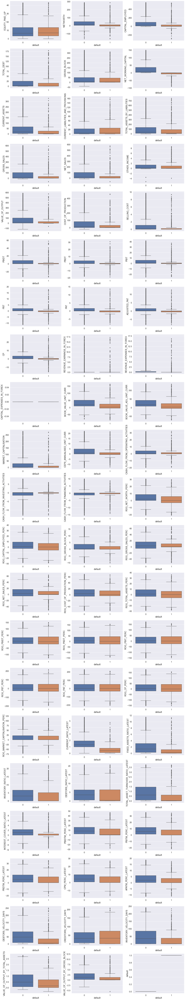

In [47]:
# data used is Xy = original data with some columns removed

plt.figure(figsize = (25,160))
sns.set(font_scale=1.5)
for i in range(len(Xy.columns)):
    plt.subplot(23, 3, i + 1)
    sns.boxplot(data=Xy,
           x='default',
           y=Xy.columns[i]
           );

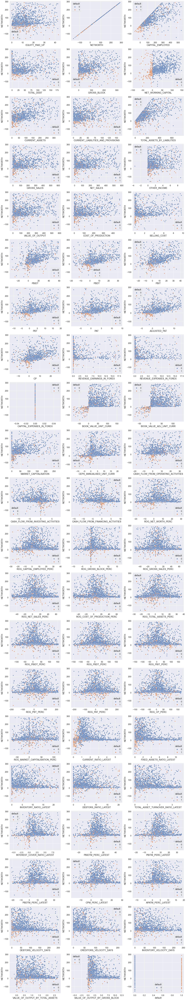

In [48]:
# we have to use the unscaled and unimputed data 

plt.figure(figsize = (25,160))
sns.set(font_scale=1.5)
for i in range(len(Xy.columns)):
    plt.subplot(23, 3, i + 1)
    sns.scatterplot(data=Xy,
           y='NETWORTH',
           x=Xy.columns[i],
           hue='default');         
           

In [49]:
corr = dfi.corr()
corr

,default,EQUITY_PAID_UP,NETWORTH,CAPITAL_EMPLOYED,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_ASSETS,CURRENT_LIABILITIES_AND_PROVISIONS,TOTAL_ASSETS_BY_LIABILITIES,...,PBIDTM_PERC_LATEST,PBITM_PERC_LATEST,PBDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_TOTAL_ASSETS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK
default,1.00,-0.02,0.01,0.01,0.01,-0.01,0.00,0.01,0.00,0.01,...,-0.00,0.00,-0.02,-0.02,-0.01,-0.02,0.01,-0.01,-0.01,0.00
EQUITY_PAID_UP,-0.02,1.00,0.47,0.51,0.37,0.48,0.32,0.46,0.47,0.53,...,0.08,0.07,0.06,0.10,0.08,0.11,0.14,0.11,-0.01,-0.00
NETWORTH,0.01,0.47,1.00,0.82,0.41,0.62,0.58,0.71,0.64,0.79,...,0.25,0.26,0.25,0.29,0.27,0.12,0.11,0.17,0.15,0.11
CAPITAL_EMPLOYED,0.01,0.51,0.82,1.00,0.61,0.74,0.61,0.82,0.76,0.94,...,0.20,0.21,0.18,0.22,0.20,0.12,0.15,0.20,0.17,0.11
TOTAL_DEBT,0.01,0.37,0.41,0.61,1.00,0.64,0.53,0.65,0.60,0.62,...,0.09,0.08,0.03,0.06,0.04,0.15,0.21,0.26,0.20,0.05
GROSS_BLOCK,-0.01,0.48,0.62,0.74,0.64,1.00,0.49,0.73,0.77,0.78,...,0.15,0.12,0.12,0.15,0.13,0.12,0.22,0.27,0.23,-0.02
NET_WORKING_CAPITAL,0.00,0.32,0.58,0.61,0.53,0.49,1.00,0.75,0.51,0.59,...,0.12,0.15,0.10,0.12,0.15,0.21,0.12,0.27,0.28,0.20
CURRENT_ASSETS,0.01,0.46,0.71,0.82,0.65,0.73,0.75,1.00,0.86,0.86,...,0.15,0.17,0.13,0.16,0.16,0.19,0.24,0.27,0.26,0.17
CURRENT_LIABILITIES_AND_PROVISIONS,0.00,0.47,0.64,0.76,0.60,0.77,0.51,0.86,1.00,0.83,...,0.15,0.15,0.12,0.15,0.15,0.15,0.28,0.24,0.26,0.14
TOTAL_ASSETS_BY_LIABILITIES,0.01,0.53,0.79,0.94,0.62,0.78,0.59,0.86,0.83,1.00,...,0.18,0.18,0.15,0.19,0.17,0.14,0.21,0.22,0.16,0.09


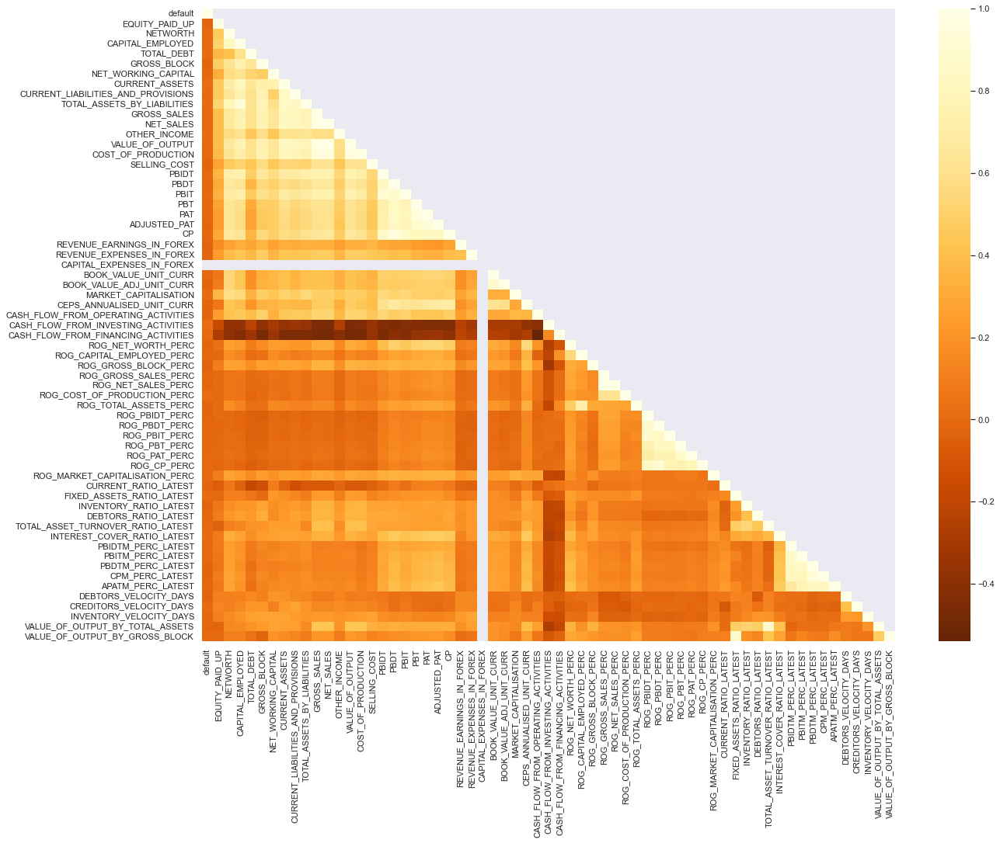

In [50]:
plt.figure(figsize = (20,15))
sns.set(font_scale=1)
mask=np.triu(corr,+1)
sns.heatmap(corr,
           mask=mask,
           cmap='YlOrBr_r');

In [51]:
# There is quite a bit of correlation between features. This will lead to multicollinearity problems.

# 1.5 Train Test Split
2

In [52]:
# This has already been done above vide code 31 and then subsequently the train and test data were scaled and imputed.

# 1.6 Build Logistic Regression Model (using statsmodel library) on most important variables on Train Dataset and choose the optimum cutoff. Also showcase your model building approach

10

In [53]:
# We need to remove multicollinearity . We will do so by the VIF method

In [54]:
# Remove 'default' from the dataset
data=dfi
Y = data["default"]
iv = data.columns
iv = iv.delete(0)
X = data[iv]
 
# calculate the variance inflation factor
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
 
# compare with each column
pd.DataFrame([vif(data[iv].values, index) for index in range(len(iv))],
             index=[iv],
             columns=['VIF']).sort_values(by='VIF',ascending=False)
 


,VIF
NET_SALES,217.62
VALUE_OF_OUTPUT,143.10
GROSS_SALES,85.34
ROG_GROSS_SALES_PERC,79.00
ROG_NET_SALES_PERC,78.75
PAT,20.28
PBDT,19.71
CP,17.28
COST_OF_PRODUCTION,16.67
TOTAL_ASSETS_BY_LIABILITIES,13.65


In [55]:
# compare with each columns
for i in range(len(iv)):
    vif_list = [vif(data[iv].values, index) for index in range(len(iv))]
    maxvif = max(vif_list)
    print("Max VIF value is ", maxvif)                     
    drop_index = vif_list.index(maxvif)
    print("For Independent variable", iv[drop_index])
    
    if maxvif > 5:
        
        print("Deleting", iv[drop_index])
        iv = iv.delete(drop_index)
        print("Final Independent_variables ", iv)
        

Max VIF value is  217.61879957102596
For Independent variable NET_SALES
Deleting NET_SALES
Final Independent_variables  Index(['EQUITY_PAID_UP', 'NETWORTH', 'CAPITAL_EMPLOYED', 'TOTAL_DEBT',
       'GROSS_BLOCK', 'NET_WORKING_CAPITAL', 'CURRENT_ASSETS',
       'CURRENT_LIABILITIES_AND_PROVISIONS', 'TOTAL_ASSETS_BY_LIABILITIES',
       'GROSS_SALES', 'OTHER_INCOME', 'VALUE_OF_OUTPUT', 'COST_OF_PRODUCTION',
       'SELLING_COST', 'PBIDT', 'PBDT', 'PBIT', 'PBT', 'PAT', 'ADJUSTED_PAT',
       'CP', 'REVENUE_EARNINGS_IN_FOREX', 'REVENUE_EXPENSES_IN_FOREX',
       'CAPITAL_EXPENSES_IN_FOREX', 'BOOK_VALUE_UNIT_CURR',
       'BOOK_VALUE_ADJ_UNIT_CURR', 'MARKET_CAPITALISATION',
       'CEPS_ANNUALISED_UNIT_CURR', 'CASH_FLOW_FROM_OPERATING_ACTIVITIES',
       'CASH_FLOW_FROM_INVESTING_ACTIVITIES',
       'CASH_FLOW_FROM_FINANCING_ACTIVITIES', 'ROG_NET_WORTH_PERC',
       'ROG_CAPITAL_EMPLOYED_PERC', 'ROG_GROSS_BLOCK_PERC',
       'ROG_GROSS_SALES_PERC', 'ROG_NET_SALES_PERC',
       'ROG_COST_OF_

In [56]:
iv

Index(['EQUITY_PAID_UP', 'NETWORTH', 'TOTAL_DEBT', 'GROSS_BLOCK',
       'NET_WORKING_CAPITAL', 'CURRENT_LIABILITIES_AND_PROVISIONS',
       'OTHER_INCOME', 'SELLING_COST', 'PBIDT', 'PBT',
       'REVENUE_EARNINGS_IN_FOREX', 'REVENUE_EXPENSES_IN_FOREX',
       'CAPITAL_EXPENSES_IN_FOREX', 'BOOK_VALUE_ADJ_UNIT_CURR',
       'MARKET_CAPITALISATION', 'CEPS_ANNUALISED_UNIT_CURR',
       'CASH_FLOW_FROM_OPERATING_ACTIVITIES',
       'CASH_FLOW_FROM_INVESTING_ACTIVITIES',
       'CASH_FLOW_FROM_FINANCING_ACTIVITIES', 'ROG_NET_WORTH_PERC',
       'ROG_CAPITAL_EMPLOYED_PERC', 'ROG_GROSS_BLOCK_PERC',
       'ROG_NET_SALES_PERC', 'ROG_COST_OF_PRODUCTION_PERC',
       'ROG_TOTAL_ASSETS_PERC', 'ROG_PBIDT_PERC', 'ROG_PBT_PERC',
       'ROG_CP_PERC', 'ROG_MARKET_CAPITALISATION_PERC', 'CURRENT_RATIO_LATEST',
       'FIXED_ASSETS_RATIO_LATEST', 'INVENTORY_RATIO_LATEST',
       'DEBTORS_RATIO_LATEST', 'TOTAL_ASSET_TURNOVER_RATIO_LATEST',
       'INTEREST_COVER_RATIO_LATEST', 'PBIDTM_PERC_LATEST', 'CPM_

In [57]:
dfi

,default,EQUITY_PAID_UP,NETWORTH,CAPITAL_EMPLOYED,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_ASSETS,CURRENT_LIABILITIES_AND_PROVISIONS,TOTAL_ASSETS_BY_LIABILITIES,...,PBIDTM_PERC_LATEST,PBITM_PERC_LATEST,PBDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_TOTAL_ASSETS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK
0,1,0.61,-0.43,-0.44,-0.56,-0.44,-0.58,-0.52,-0.33,-0.45,...,-0.75,-0.64,-0.63,-0.63,-0.48,-0.95,-0.94,-0.85,-0.97,-0.80
1,1,-0.56,-0.54,-0.61,-0.54,-0.59,-0.59,-0.66,-0.60,-0.63,...,1.28,1.95,1.91,2.50,1.18,-0.95,-0.94,-0.85,-0.97,-0.80
2,0,0.04,-0.42,-0.51,-0.43,-0.59,-0.45,-0.59,-0.58,-0.55,...,-0.36,-0.14,-0.14,-0.26,0.08,-0.54,-0.94,-0.85,-0.88,-0.17
3,1,-0.30,0.44,-0.05,-0.45,-0.11,-0.66,-0.45,-0.11,-0.12,...,1.13,0.15,1.66,1.93,0.44,0.11,1.81,0.46,-0.35,-0.60
4,0,-0.45,-0.41,-0.47,-0.34,-0.22,-0.54,-0.48,-0.28,-0.46,...,0.95,0.78,0.99,0.98,0.60,0.95,1.03,0.81,0.32,-0.41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3581,1,-0.41,0.40,1.34,-0.56,1.46,0.48,0.09,0.63,1.29,...,0.33,0.46,0.66,0.52,0.74,-0.82,0.30,1.71,1.33,1.20
3582,0,0.58,-0.28,-0.40,-0.35,-0.36,-0.24,-0.41,-0.44,-0.45,...,0.02,0.11,0.35,0.31,-0.42,3.40,1.48,3.40,-1.02,-0.82
3583,0,-0.70,-1.19,-0.61,0.26,-0.02,-0.91,-0.59,-0.14,-0.54,...,0.46,0.42,0.77,1.20,1.37,-0.02,1.94,-0.26,1.89,-0.37
3584,0,-0.89,-0.59,-0.64,-0.56,-0.59,-0.59,-0.66,-0.59,-0.65,...,-0.81,-0.71,-0.71,-0.72,-0.62,-0.95,-0.94,-0.85,-0.97,-0.80


In [58]:
dfi_final=dfi[iv]
display(dfi_final.shape)

(3586, 42)

In [59]:
dfi_final.columns.to_list()

['EQUITY_PAID_UP',
 'NETWORTH',
 'TOTAL_DEBT',
 'GROSS_BLOCK',
 'NET_WORKING_CAPITAL',
 'CURRENT_LIABILITIES_AND_PROVISIONS',
 'OTHER_INCOME',
 'SELLING_COST',
 'PBIDT',
 'PBT',
 'REVENUE_EARNINGS_IN_FOREX',
 'REVENUE_EXPENSES_IN_FOREX',
 'CAPITAL_EXPENSES_IN_FOREX',
 'BOOK_VALUE_ADJ_UNIT_CURR',
 'MARKET_CAPITALISATION',
 'CEPS_ANNUALISED_UNIT_CURR',
 'CASH_FLOW_FROM_OPERATING_ACTIVITIES',
 'CASH_FLOW_FROM_INVESTING_ACTIVITIES',
 'CASH_FLOW_FROM_FINANCING_ACTIVITIES',
 'ROG_NET_WORTH_PERC',
 'ROG_CAPITAL_EMPLOYED_PERC',
 'ROG_GROSS_BLOCK_PERC',
 'ROG_NET_SALES_PERC',
 'ROG_COST_OF_PRODUCTION_PERC',
 'ROG_TOTAL_ASSETS_PERC',
 'ROG_PBIDT_PERC',
 'ROG_PBT_PERC',
 'ROG_CP_PERC',
 'ROG_MARKET_CAPITALISATION_PERC',
 'CURRENT_RATIO_LATEST',
 'FIXED_ASSETS_RATIO_LATEST',
 'INVENTORY_RATIO_LATEST',
 'DEBTORS_RATIO_LATEST',
 'TOTAL_ASSET_TURNOVER_RATIO_LATEST',
 'INTEREST_COVER_RATIO_LATEST',
 'PBIDTM_PERC_LATEST',
 'CPM_PERC_LATEST',
 'APATM_PERC_LATEST',
 'DEBTORS_VELOCITY_DAYS',
 'CREDITORS_V

In [60]:
y

,default
0,1
1,1
2,0
3,1
4,0
...,...
3581,1
3582,0
3583,0
3584,0


In [61]:
dfi_final=pd.concat([dfi_final,Y],axis=1)
dfi_final

,EQUITY_PAID_UP,NETWORTH,TOTAL_DEBT,GROSS_BLOCK,NET_WORKING_CAPITAL,CURRENT_LIABILITIES_AND_PROVISIONS,OTHER_INCOME,SELLING_COST,PBIDT,PBT,...,TOTAL_ASSET_TURNOVER_RATIO_LATEST,INTEREST_COVER_RATIO_LATEST,PBIDTM_PERC_LATEST,CPM_PERC_LATEST,APATM_PERC_LATEST,DEBTORS_VELOCITY_DAYS,CREDITORS_VELOCITY_DAYS,INVENTORY_VELOCITY_DAYS,VALUE_OF_OUTPUT_BY_GROSS_BLOCK,default
0,0.61,-0.43,-0.56,-0.44,-0.58,-0.33,-0.57,-0.51,-0.48,-0.37,...,-0.91,-0.56,-0.75,-0.63,-0.48,-0.95,-0.94,-0.85,-0.80,1
1,-0.56,-0.54,-0.54,-0.59,-0.59,-0.60,-0.58,-0.51,-0.47,-0.34,...,-0.88,-0.56,1.28,2.50,1.18,-0.95,-0.94,-0.85,-0.80,1
2,0.04,-0.42,-0.43,-0.59,-0.45,-0.58,-0.58,-0.48,-0.46,-0.31,...,-0.83,-0.56,-0.36,-0.26,0.08,-0.54,-0.94,-0.85,-0.17,0
3,-0.30,0.44,-0.45,-0.11,-0.66,-0.11,-0.39,-0.29,0.38,0.06,...,-0.39,0.01,1.13,1.93,0.44,0.11,1.81,0.46,-0.60,1
4,-0.45,-0.41,-0.34,-0.22,-0.54,-0.28,-0.42,-0.16,-0.15,0.02,...,0.51,0.77,0.95,0.98,0.60,0.95,1.03,0.81,-0.41,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3581,-0.41,0.40,-0.56,1.46,0.48,0.63,0.46,0.74,0.23,1.20,...,1.07,1.01,0.33,0.52,0.74,-0.82,0.30,1.71,1.20,1
3582,0.58,-0.28,-0.35,-0.36,-0.24,-0.44,-0.58,-0.50,-0.41,-0.56,...,-0.77,-0.56,0.02,0.31,-0.42,3.40,1.48,3.40,-0.82,0
3583,-0.70,-1.19,0.26,-0.02,-0.91,-0.14,1.58,0.46,-0.21,-0.01,...,0.97,0.53,0.46,1.20,1.37,-0.02,1.94,-0.26,-0.37,0
3584,-0.89,-0.59,-0.56,-0.59,-0.59,-0.59,-0.55,-0.50,-0.49,-0.40,...,-0.91,-0.56,-0.81,-0.72,-0.62,-0.95,-0.94,-0.85,-0.80,0


In [62]:
pd.DataFrame([vif(dfi_final.values, index) for index in range(len(dfi_final.columns))],
             index=dfi_final.columns,
             columns=['VIF']).sort_values(by='VIF',ascending=False)

,VIF
CPM_PERC_LATEST,4.99
PBIDT,4.34
FIXED_ASSETS_RATIO_LATEST,4.28
VALUE_OF_OUTPUT_BY_GROSS_BLOCK,4.10
GROSS_BLOCK,4.00
ROG_PBIDT_PERC,3.82
ROG_CP_PERC,3.76
NETWORTH,3.65
CURRENT_LIABILITIES_AND_PROVISIONS,3.60
APATM_PERC_LATEST,3.43


# 1.6 Build Logistic Regression Model (using statsmodel library) on most important variables on Train Dataset and choose the optimum cutoff. Also showcase your model building approach
10

In [63]:
f1 = 'default~EQUITY_PAID_UP+ NETWORTH+ TOTAL_DEBT+ GROSS_BLOCK+ NET_WORKING_CAPITAL+ CURRENT_LIABILITIES_AND_PROVISIONS+ OTHER_INCOME+ SELLING_COST+ PBIDT+ PBT+ REVENUE_EARNINGS_IN_FOREX+ REVENUE_EXPENSES_IN_FOREX+ CAPITAL_EXPENSES_IN_FOREX+ BOOK_VALUE_ADJ_UNIT_CURR+ MARKET_CAPITALISATION+ CEPS_ANNUALISED_UNIT_CURR+ CASH_FLOW_FROM_OPERATING_ACTIVITIES+ CASH_FLOW_FROM_INVESTING_ACTIVITIES+ CASH_FLOW_FROM_FINANCING_ACTIVITIES+ ROG_NET_WORTH_PERC+ ROG_CAPITAL_EMPLOYED_PERC+ ROG_GROSS_BLOCK_PERC+ ROG_NET_SALES_PERC+ ROG_COST_OF_PRODUCTION_PERC+ ROG_TOTAL_ASSETS_PERC+ ROG_PBIDT_PERC+ ROG_PBT_PERC+ ROG_CP_PERC+ ROG_MARKET_CAPITALISATION_PERC+ CURRENT_RATIO_LATEST+ FIXED_ASSETS_RATIO_LATEST+ INVENTORY_RATIO_LATEST+ DEBTORS_RATIO_LATEST+ TOTAL_ASSET_TURNOVER_RATIO_LATEST+ INTEREST_COVER_RATIO_LATEST+ PBIDTM_PERC_LATEST+ CPM_PERC_LATEST+ APATM_PERC_LATEST+ DEBTORS_VELOCITY_DAYS+ CREDITORS_VELOCITY_DAYS+ INVENTORY_VELOCITY_DAYS+ VALUE_OF_OUTPUT_BY_GROSS_BLOCK'


# Model 1

In [64]:
X = dfi_final.drop('default',axis=1)
y = dfi_final['default']

In [65]:
X_train,X_test,y_train,y_test=train_test_split(X,y,stratify=y,random_state=seed,test_size=0.33)

In [66]:
LR=LogisticRegression()
LR.fit(X_train,y_train)

LogisticRegression()

In [67]:
y_train_predict = LR.predict(X_train)
y_test_predict = LR.predict(X_test)

In [68]:
from sklearn.metrics import confusion_matrix,classification_report
cm_test = confusion_matrix(y_test, y_test_predict)
cm_train = confusion_matrix(y_train, y_train_predict)
print('Test Data - Confusion Matrix','\n',cm_test)
print('\n')
print('Train Data - Confusion Matrix','\n',cm_train)

Test Data - Confusion Matrix 
 [[1005    0]
 [ 179    0]]


Train Data - Confusion Matrix 
 [[2038    0]
 [ 364    0]]


# Model 2 using RFE

In [69]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [70]:
selector = RFE(estimator = LR, n_features_to_select=15, step=1)

In [71]:
selector = selector.fit(X_train, y_train)

In [72]:
selector.n_features_

15

In [73]:
selector.ranking_

array([ 1,  1,  1,  1, 23,  1,  1,  2,  8, 14, 15, 21, 28,  1, 27, 20, 18,
        1,  3,  4, 26,  1,  1,  1,  5,  1, 24,  1, 16, 13, 12,  6, 25,  7,
       11, 17, 22,  9,  1,  1, 10, 19])

In [74]:
df = pd.DataFrame({'Feature': X_train.columns, 'Rank': selector.ranking_})
df_top15=df[df['Rank'] == 1]
df_top15

,Feature,Rank
0,EQUITY_PAID_UP,1
1,NETWORTH,1
2,TOTAL_DEBT,1
3,GROSS_BLOCK,1
5,CURRENT_LIABILITIES_AND_PROVISIONS,1
6,OTHER_INCOME,1
13,BOOK_VALUE_ADJ_UNIT_CURR,1
17,CASH_FLOW_FROM_INVESTING_ACTIVITIES,1
21,ROG_GROSS_BLOCK_PERC,1
22,ROG_NET_SALES_PERC,1


In [75]:
top_15=df_top15['Feature']
top_15.values

array(['EQUITY_PAID_UP', 'NETWORTH', 'TOTAL_DEBT', 'GROSS_BLOCK',
       'CURRENT_LIABILITIES_AND_PROVISIONS', 'OTHER_INCOME',
       'BOOK_VALUE_ADJ_UNIT_CURR', 'CASH_FLOW_FROM_INVESTING_ACTIVITIES',
       'ROG_GROSS_BLOCK_PERC', 'ROG_NET_SALES_PERC',
       'ROG_COST_OF_PRODUCTION_PERC', 'ROG_PBIDT_PERC', 'ROG_CP_PERC',
       'DEBTORS_VELOCITY_DAYS', 'CREDITORS_VELOCITY_DAYS'], dtype=object)

In [76]:
X_train_15features = X_train[top_15.values]
X_train_15features.shape

(2402, 15)

In [77]:
X_test_15features = X_test[top_15.values]
X_test_15features.shape

(1184, 15)

In [78]:
LR = LogisticRegression()
LR.fit(X_train_15features,y_train)

LogisticRegression()

In [79]:
y_train_predict_rfe = LR.predict(X_train_15features)
y_test_predict_rfe = LR.predict(X_test_15features)

In [80]:
cm_test_rfe = confusion_matrix(y_test, y_test_predict_rfe)
cm_train_rfe = confusion_matrix(y_train, y_train_predict_rfe)
print('Test Data - Confusion Matrix RFE','\n',cm_test_rfe)
print('\n')
print('Train Data - Confusion Matrix RFE','\n',cm_train_rfe)

Test Data - Confusion Matrix RFE 
 [[1005    0]
 [ 179    0]]


Train Data - Confusion Matrix RFE 
 [[2038    0]
 [ 364    0]]


# Model 3 - after balancing the data with SMOTE ( 75, 25)

In [81]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state=seed,sampling_strategy=0.75)
X_res, y_res = sm.fit_resample(X_train, y_train)
LR = LogisticRegression()
LR.fit(X_res,y_res)
y_train_predict_smote = LR.predict(X_res)
y_test_predict_smote = LR.predict(X_test)
cm_test = confusion_matrix(y_test, y_test_predict_smote)
cm_train = confusion_matrix(y_res, y_train_predict_smote)
print('Test Data - Confusion Matrix SMOTE','\n',cm_test)
print('\n')
print('Train Data - Confusion Matrix SMOTE','\n',cm_train)

Test Data - Confusion Matrix SMOTE 
 [[777 228]
 [142  37]]


Train Data - Confusion Matrix SMOTE 
 [[1583  455]
 [ 979  549]]


In [82]:
cr_test = classification_report(y_test, y_test_predict_smote)
cr_train = classification_report(y_res, y_train_predict_smote)
print('Test Data - Classification Report SMOTE','\n',cr_test)
print('\n')
print('Train Data - Classification Report SMOTE','\n',cr_train)

Test Data - Classification Report SMOTE 
               precision    recall  f1-score   support

           0       0.85      0.77      0.81      1005
           1       0.14      0.21      0.17       179

    accuracy                           0.69      1184
   macro avg       0.49      0.49      0.49      1184
weighted avg       0.74      0.69      0.71      1184



Train Data - Classification Report SMOTE 
               precision    recall  f1-score   support

           0       0.62      0.78      0.69      2038
           1       0.55      0.36      0.43      1528

    accuracy                           0.60      3566
   macro avg       0.58      0.57      0.56      3566
weighted avg       0.59      0.60      0.58      3566



# Model 4 - SMOTE ( 65 , 35)

In [83]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state=seed,sampling_strategy=0.7)
X_res, y_res = sm.fit_resample(X_train, y_train)
LR = LogisticRegression()
LR.fit(X_res,y_res)
y_train_predict_smote = LR.predict(X_res)
y_test_predict_smote = LR.predict(X_test)
cm_test = confusion_matrix(y_test, y_test_predict_smote)
cm_train = confusion_matrix(y_res, y_train_predict_smote)
print('Test Data - Confusion Matrix SMOTE','\n',cm_test)
print('\n')
print('Train Data - Confusion Matrix SMOTE','\n',cm_train)

Test Data - Confusion Matrix SMOTE 
 [[830 175]
 [152  27]]


Train Data - Confusion Matrix SMOTE 
 [[1702  336]
 [1056  370]]


# 1.7 Validate the Model on Test Dataset and state the performance matrices. Also state interpretation from the model
7

# Model 5 by changing the cut off to 0.7

## Prediction on the Train data

In [84]:
y_class_pred_train=[]
for i in range(0,len(y_train_predict_smote)):
    if np.array(y_train_predict_smote)[i]>0.7:
        a=1
    else:
        a=0
    y_class_pred_train.append(a)

SMOTE data - Results with cut of at 0.7 on Train Data
              precision    recall  f1-score   support

           0       0.62      0.84      0.71      2038
           1       0.52      0.26      0.35      1426

    accuracy                           0.60      3464
   macro avg       0.57      0.55      0.53      3464
weighted avg       0.58      0.60      0.56      3464



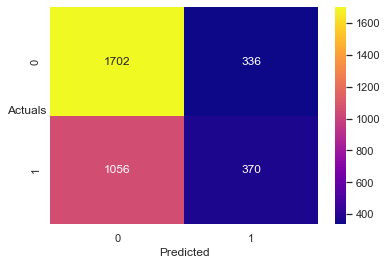

In [85]:
print('SMOTE data - Results with cut of at 0.7 on Train Data' )

sns.heatmap((confusion_matrix(y_res,y_class_pred_train)),annot=True,fmt='.5g'
            ,cmap='plasma');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
print(classification_report(y_res,y_class_pred_train))


## Prediction on the Test data

In [86]:
y_class_pred_test=[]
for i in range(0,len(y_test_predict_smote)):
    if np.array(y_test_predict_smote)[i]>0.7:
        a=1
    else:
        a=0
    y_class_pred_test.append(a)

SMOTE data - Results with cut of at 0.7 on Test Data
              precision    recall  f1-score   support

           0       0.85      0.83      0.84      1005
           1       0.13      0.15      0.14       179

    accuracy                           0.72      1184
   macro avg       0.49      0.49      0.49      1184
weighted avg       0.74      0.72      0.73      1184



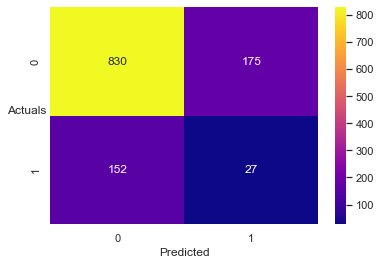

In [87]:
print('SMOTE data - Results with cut of at 0.7 on Test Data' )
sns.heatmap((confusion_matrix(y_test,y_class_pred_test)),annot=True,fmt='.5g'
            ,cmap='plasma');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
print(classification_report(y_test,y_class_pred_test))

# Model 5 by changing the cut off to 0.

SMOTE data - Results with cut of at 0.1  on Train Data
              precision    recall  f1-score   support

           0       0.62      0.84      0.71      2038
           1       0.52      0.26      0.35      1426

    accuracy                           0.60      3464
   macro avg       0.57      0.55      0.53      3464
weighted avg       0.58      0.60      0.56      3464

SMOTE data - Results with cut of at 0.1  on Test Data
              precision    recall  f1-score   support

           0       0.85      0.83      0.84      1005
           1       0.13      0.15      0.14       179

    accuracy                           0.72      1184
   macro avg       0.49      0.49      0.49      1184
weighted avg       0.74      0.72      0.73      1184



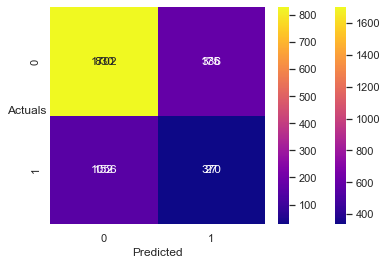

In [88]:
cutoff = 0.1
y_class_pred_train=[]
for i in range(0,len(y_train_predict_smote)):
    if np.array(y_train_predict_smote)[i]>cutoff:
        a=1
    else:
        a=0
    y_class_pred_train.append(a)
print('SMOTE data - Results with cut of at', cutoff,' on Train Data' )

sns.heatmap((confusion_matrix(y_res,y_class_pred_train)),annot=True,fmt='.5g'
            ,cmap='plasma');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
print(classification_report(y_res,y_class_pred_train))
y_class_pred_test=[]
for i in range(0,len(y_test_predict_smote)):
    if np.array(y_test_predict_smote)[i]>cutoff:
        a=1
    else:
        a=0
    y_class_pred_test.append(a)
print('SMOTE data - Results with cut of at',cutoff,' on Test Data' )
sns.heatmap((confusion_matrix(y_test,y_class_pred_test)),annot=True,fmt='.5g'
            ,cmap='plasma');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
print(classification_report(y_test,y_class_pred_test))
